**Actividad:** M7_AI3_Transferencia de estilo

**Estudiante:** César Emilio García Ávalos

# Neural Style Transfer
En el pdf de la actividad se describe brevemente el método de generación de imágenes **Neural Style Transfer**. No se pretende adquirir un conocimiento profundo de este método sino utilizar la práctica para adquirir un **conocimiento intuitivo de las Redes Neuronales Convolucionales como extractores de características**.

En primer lugar, importamos PyTorch junto con otros paquetes.

In [1]:
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

## Transfer Learning: descargamos VGG19
En esta actividad vamos a utilizar el primer bloque de VGG19, que sirve para **extraer las características** de la imagen de entrada

In [2]:
# reutilizamos el modelo pre-entrenado VGG19
vgg_all = models.vgg19(pretrained=True)

# pero seleccionamos solo el primer bloque de la red que extrae features
vgg_features = vgg_all.features

# congelamos porque solo queremos optimizar la imagen target
for param in vgg_features.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:11<00:00, 51.8MB/s]


## VGG19 - Clasificador
Aunque en esta práctica solo vamos a utilizar el bloque extractor de características, podemos aprovechar para echarle un vistazo al bloque de **clasificación**.

Comprobamos que el segundo bloque, el clasificador, está compuesto por:
* capas lineales (Linear)
* funciones de activación ReLU
* capas de dropout para evitar overfitting

Si quisiéramos utilizar VGG19 como clasificador de un dataset de imágenes, deberíamos sustituir este bloque por otro similar con tantas salidas como clases haya en el dataset.

In [3]:
vgg_classifier = vgg_all.classifier
print(vgg_classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


## Pasamos modelo a GPU si está disponible

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg_features.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## load_image
Función para cargar una imagen

In [5]:
def load_image(img_path, max_size=300, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= max_size pixels in the x-y dims.'''
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')

    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    # VGG está normalizada con los valores de Imagenet: 0.406, 0.456, 0.485 en BGR, que invertimos en RGB.
    # En rango 0-255 seria 103.94, 116.78, 123.68 en BGR
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])

    # con :3 eliminamos el último canal de la primera dimensión, que es el alfa e indica la transparencia
    # con unsqueeze(0) añadimos como primera dimensión el batch
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

## Carga de las imágenes de contenido y estilo
Además, cambiamos tamaño de la imagen de estilo a la de contenido.

In [6]:
# cargamos las imágenes de contenido y estilo
img_quinta = "https://github.com/albertojulian/master-ub/raw/main/quinta.jpeg"
img_palamos = "https://github.com/albertojulian/master-ub/raw/main/playa_palamos.jpg"
img_soto = "https://github.com/albertojulian/master-ub/raw/main/soto_cruz_mazo.jpg"

content = load_image(img_soto).to(device)

img_van_gogh = "https://github.com/md-lorente/Master_BD_DS/blob/main/m%C3%B3dulo_7_aprendizaje_autom%C3%A1tico_para_machine_learning/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg?raw=true"
img_kandinsky = "https://github.com/md-lorente/Master_BD_DS/blob/main/m%C3%B3dulo_7_aprendizaje_autom%C3%A1tico_para_machine_learning/Vassily_Kandinsky,_1913_-_Composition_7.jpg?raw=true"

# cambia tamaño de la imagen de estilo: coge los dos últimos valores de shape de la imagen de contenido
from time import sleep
error = True
while error == True:
    try:
      style = load_image(img_van_gogh, shape=content.shape[-2:]).to(device)
      error = False
    except:
      print("retry")
      sleep(1)

## im_convert
Es una función de ayuda para pasar una imagen de Tensor a numpy y poderla visualizar

In [7]:
def im_convert(tensor):

    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0) # cambia ancho por alto
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

## Veamos las imágenes de contenido y estilo

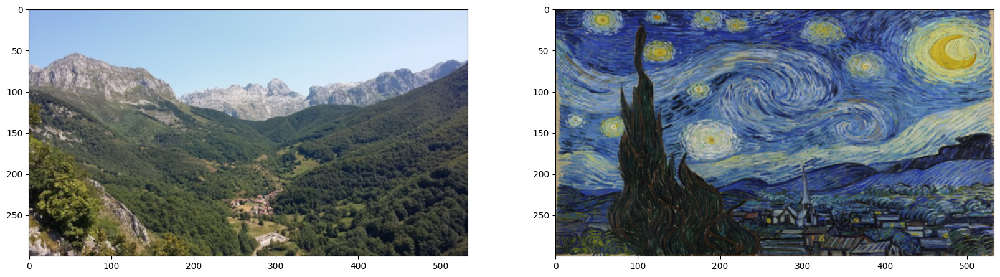

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))

## Capas de vgg_features
Veamos los identificadores de capas del extractor de características, vgg_features

In [9]:
print(vgg_features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Extracción de características
La función get_features se utiliza para extraer las características de las imágenes de contenido y estilo.

En primer lugar, filtramos las capas que vamos a tener en cuenta para la extracción de características según se indica en el artículo de referencia. Utilizaremos varias capas para el estilo pero solo una (conv4_2) para el contenido.

A continuación, extraemos las características de la imagen para las capas seleccionadas.

In [10]:
def get_features(image, model, layers=None):

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## contenido
                  '28': 'conv5_1'}

    features = {}
    x = image
    # model._modules es un diccionario con todas las capas
    for name, layer in model._modules.items():
        x = layer(x) # la imagen se va transformando en cada capa...
        if name in layers: # ...pero solo extraemos las características de las capas seleccionadas
            features[layers[name]] = x

    return features


## Matriz Gram
El método Style Transfer utiliza la matriz Gram o Gramian para procesar las características.

Ver https://en.wikipedia.org/wiki/Gramian_matrix

In [11]:
def gram_matrix(tensor):

    # obtenemos batch_size, depth, height y width del Tensor
    b, d, h, w = tensor.size()

    # convertimos el tensor a 2D multiplicando dimensiones entre sí
    tensor = tensor.view(b * d, h * w)

    # calculamos la matriz gram multiplicando el tensor por su transpuesto
    gram = torch.mm(tensor, tensor.t())

    return gram

## Definimos los parámetros a probar
* Definimos los pesos de las capas de estilo. Excluimos conv4_2 porque es la capa de la que extraemos el contenido.
* Definimos valores de los pesos de contenido y estilo para la función de pérdida (content_weight, style_weight).
* Definimos la tasa de aprendizaje.
* Definimos el número de iteraciones (steps)


In [12]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

learning_rate = 0.1

steps = 500 # número de iteraciones

# definimos cada cuántas imágenes queremos hacer una visualización intermedia
show_every = 100

## Inicialización y entrenamiento del modelo
Tareas:
* definimos las capas del nuevo modelo
* inicializamos la imagen generada con la imagen de contenido
* definimos el optimizador
* modificamos la imagen generada mediante la función de pérdida, compuesta por la suma de la pérdida de estilo y la de contenido ponderadas

Pérdida total:  1060671.625


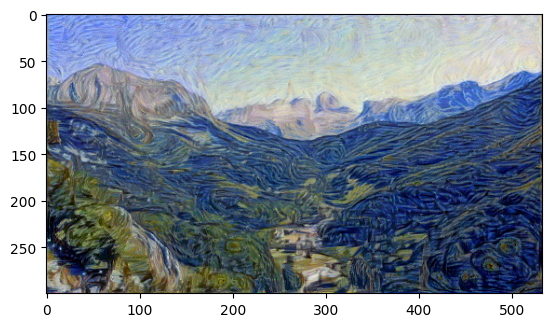

Pérdida total:  452268.5625


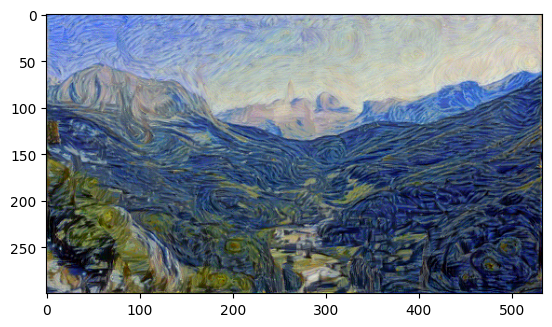

Pérdida total:  291003.25


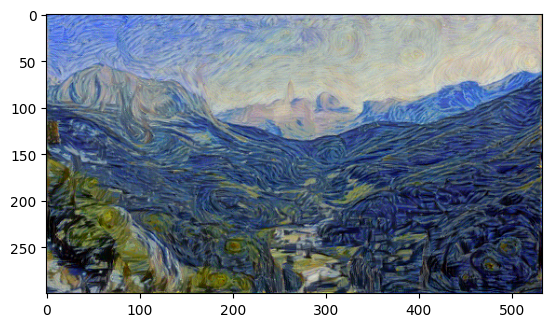

Pérdida total:  203507.859375


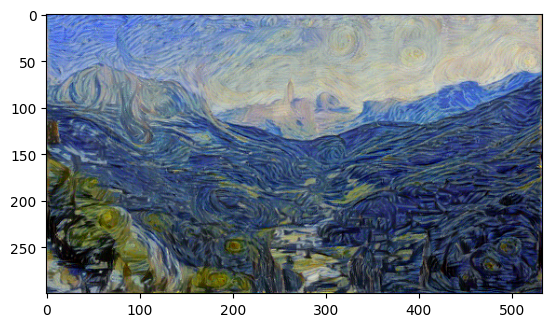

Pérdida total:  220317.203125


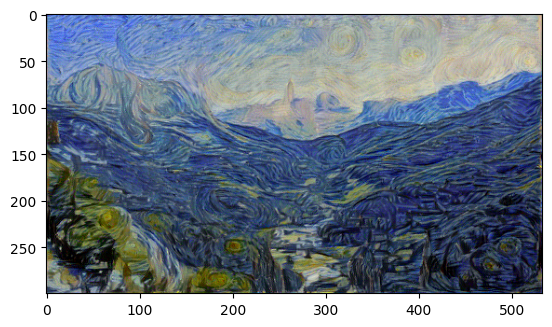

In [13]:
# extraemos características de contenido y estilo de las imágenes originales
content_features = get_features(content, vgg_features)
style_features = get_features(style, vgg_features)

# calculamos la matriz gram de cada capa de estilo
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# creamos una tercera imagen "target" que se va a ir modificando
# La inicializamos con la imagen de contenido...
# ...y le vamos cambiando el estilo
target = content.clone().requires_grad_(True).to(device)

# definimos el optimizador sobre los parámetros de la imagen target
optimizer = optim.Adam([target], lr=learning_rate)

for ii in range(1, steps+1):

    # extraemos las características de la imagen generada
    target_features = get_features(target, vgg_features)

    # definimos la función de pérdida de contenido
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

    # definimos la función de pérdida de estilo como suma de la pérdida de cada capa
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        # calculamos la "pérdida de estilo" de la capa actual y la ponderamos
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # la añadimos a la pérdida de estilo
        style_loss += layer_style_loss / (d * h * w)

    # calculamos la pérdida total
    total_loss = content_weight * content_loss + style_weight * style_loss

    # actualizamos la imagen generada mediante el optimizador
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # mostramos las imágenes intermedias y su pérdida
    if  ii % show_every == 0:
        print('Pérdida total: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

## Veamos la imagen de contenido y la generada (final)

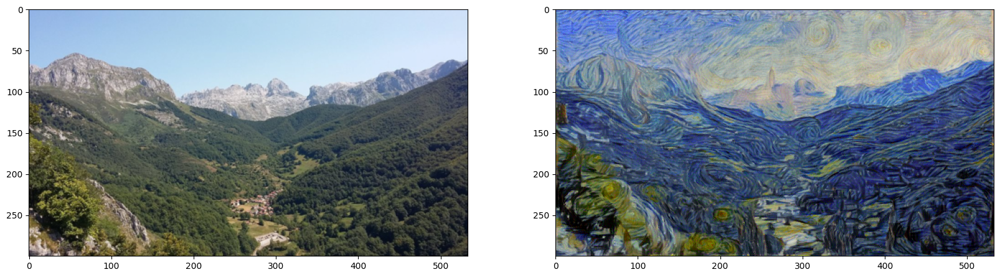

In [14]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## Almacenamiento en local
Por último, si queremos conservar la imagen resultante, podemos bajarla imagen a nuestro ordenador.

In [15]:
from google.colab import files
target_path = "content_style.jpg"

target_im = im_convert(target)
target_im = target_im * 255
target_im = target_im.astype('uint8')
Image.fromarray(target_im).save(target_path)

files.download(target_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **REALIZACIÓN DE LA ACTIVIDAD**

In [16]:
vgg_classifier = vgg_all.classifier
print(vgg_classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


In [17]:
vgg_features = vgg_all.features
print(vgg_features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

**Modificando pesos**

Ejecutando con content_weight=1, style_weight=1000000.0
Iteración 100, Pérdida total: 1060671.625


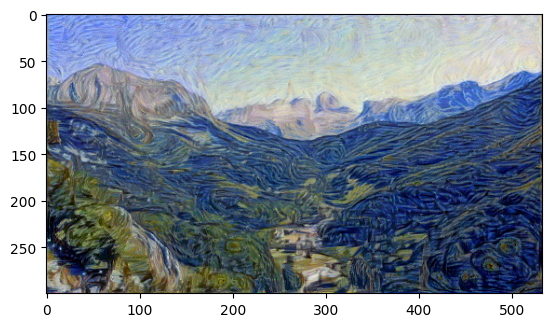

Iteración 200, Pérdida total: 452268.5625


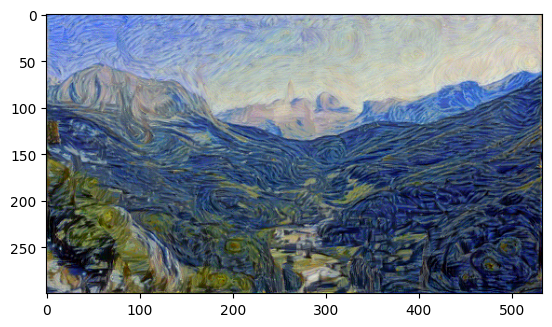

Iteración 300, Pérdida total: 291003.25


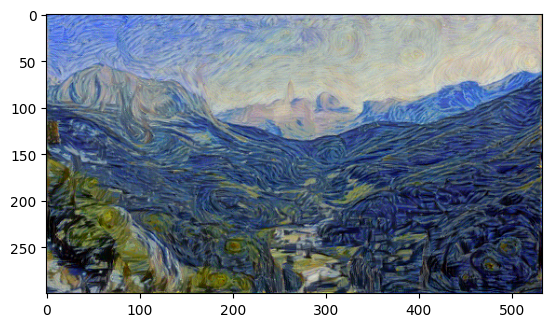

Iteración 400, Pérdida total: 203507.859375


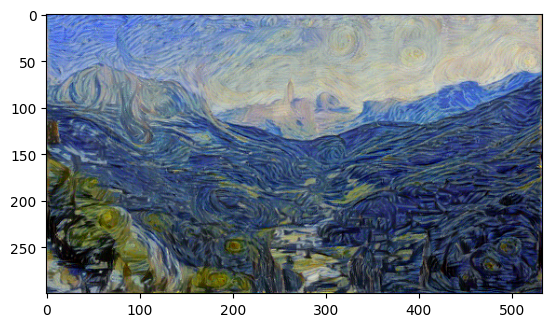

Iteración 500, Pérdida total: 220317.203125


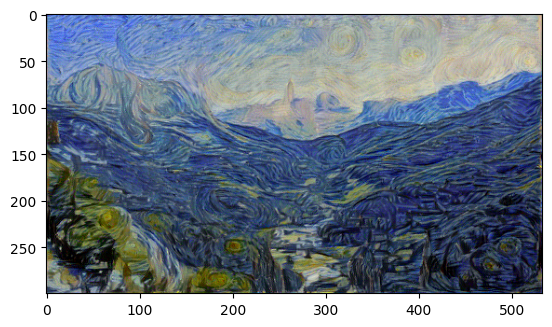

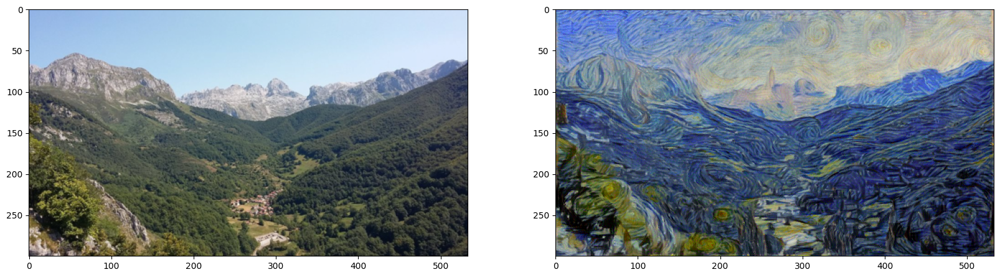

Ejecutando con content_weight=100.0, style_weight=100.0
Iteración 100, Pérdida total: 358.4736328125


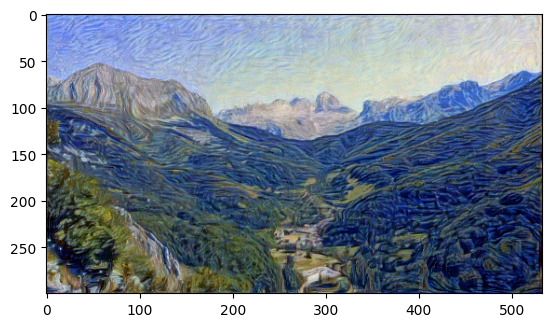

Iteración 200, Pérdida total: 277.3681945800781


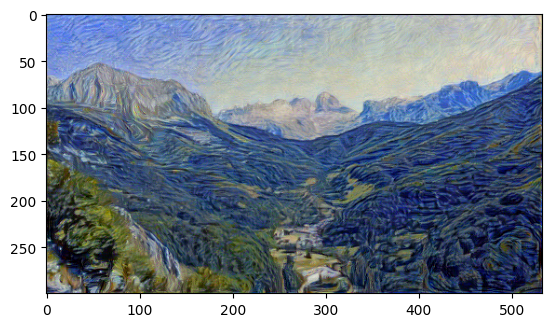

Iteración 300, Pérdida total: 246.25027465820312


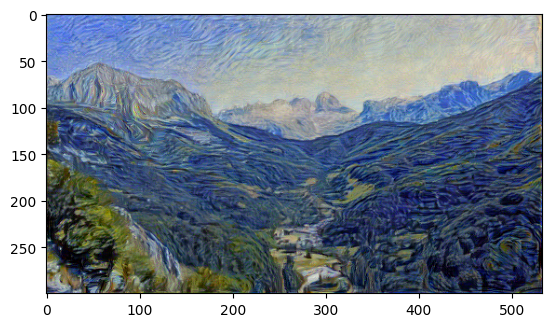

Iteración 400, Pérdida total: 645.302734375


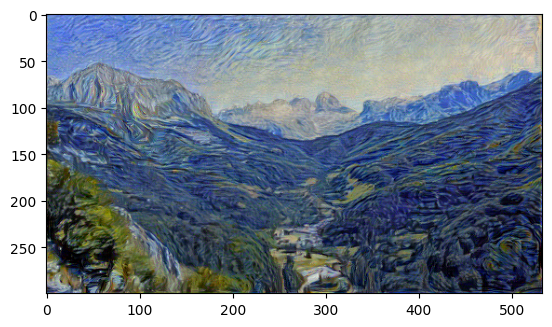

Iteración 500, Pérdida total: 226.54978942871094


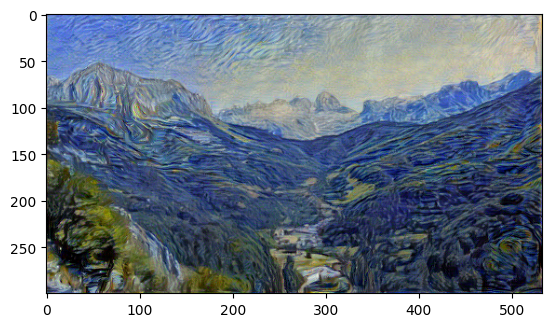

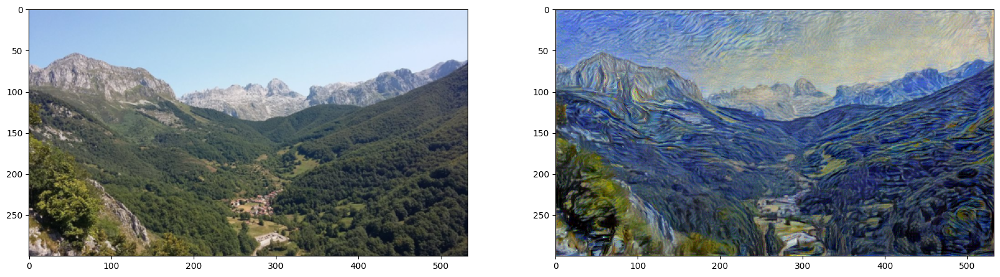

Ejecutando con content_weight=100.0, style_weight=0.01
Iteración 100, Pérdida total: 6.174467086791992


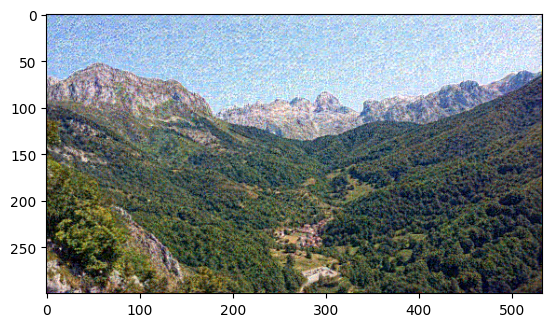

Iteración 200, Pérdida total: 3.844014883041382


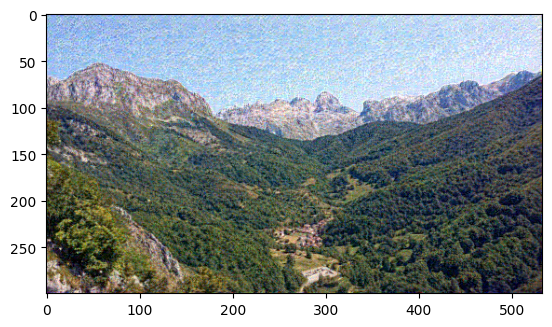

Iteración 300, Pérdida total: 3.3692679405212402


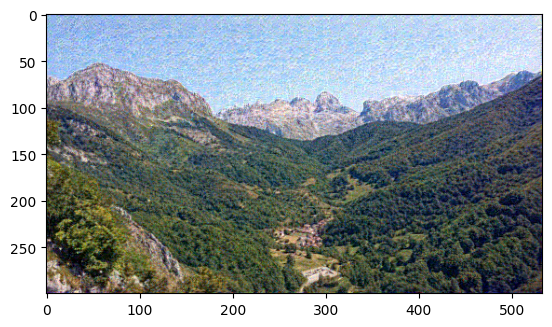

Iteración 400, Pérdida total: 3.569821834564209


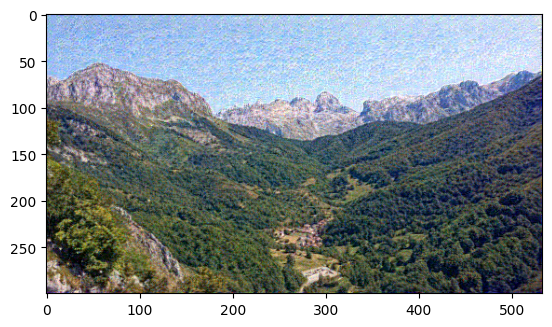

Iteración 500, Pérdida total: 3.07989239692688


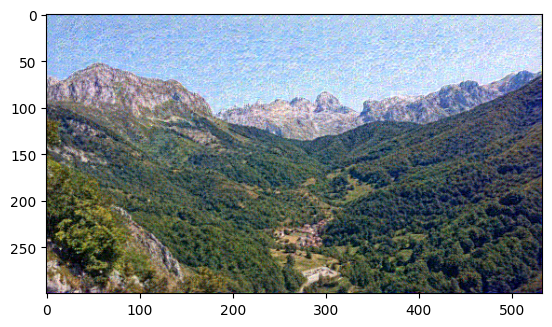

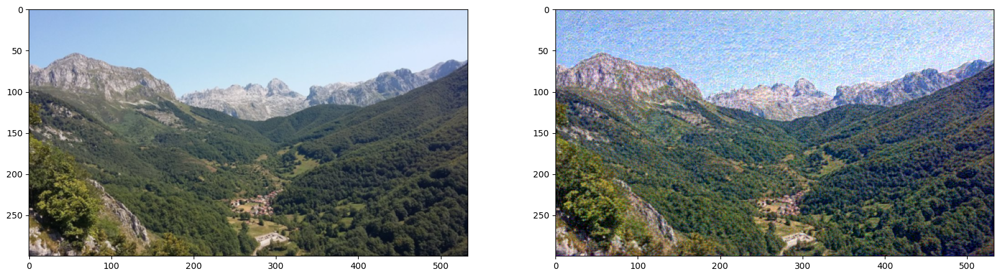

In [18]:
# Configuración de parámetros
param_sets = [
    (1, 1e6),
    (1e2, 1e2),
    (1e2, 1e-2)
]

# Otros parámetros constantes
learning_rate = 0.1
steps = 500 # número de iteraciones
show_every = 100

for content_weight, style_weight in param_sets:
    print(f"Ejecutando con content_weight={content_weight}, style_weight={style_weight}")

    # Extraer características de contenido y estilo de las imágenes originales
    content_features = get_features(content, vgg_features)
    style_features = get_features(style, vgg_features)

    # Calcular la matriz gram de cada capa de estilo
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # Crear una tercera imagen "target" que se va a ir modificando
    target = content.clone().requires_grad_(True).to(device)

    # Definir el optimizador sobre los parámetros de la imagen target
    optimizer = optim.Adam([target], lr=learning_rate)

    for ii in range(1, steps + 1):
        # Extraer las características de la imagen generada
        target_features = get_features(target, vgg_features)

        # Definir la función de pérdida de contenido
        content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2']) ** 2)

        # Definir la función de pérdida de estilo como suma de la pérdida de cada capa
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            # Calcular la "pérdida de estilo" de la capa actual y la ponderar
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
            # Añadirla a la pérdida de estilo
            style_loss += layer_style_loss / (d * h * w)

        # Calcular la pérdida total
        total_loss = content_weight * content_loss + style_weight * style_loss

        # Actualizar la imagen generada mediante el optimizador
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Mostrar las imágenes intermedias y su pérdida
        if ii % show_every == 0:
            print(f"Iteración {ii}, Pérdida total: {total_loss.item()}")
            plt.imshow(im_convert(target))
            plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(im_convert(content))
    ax2.imshow(im_convert(target))
    plt.show()


**Modificando la tasa de aprendizaje**

Ejecutando con learning_rate=0.003
Iteración 100, Pérdida total: 3002.92041015625


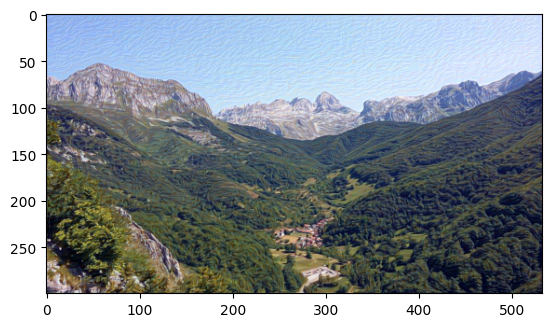

Iteración 200, Pérdida total: 1536.1763916015625


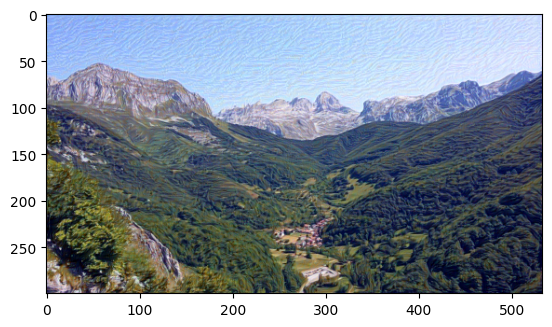

Iteración 300, Pérdida total: 1104.686279296875


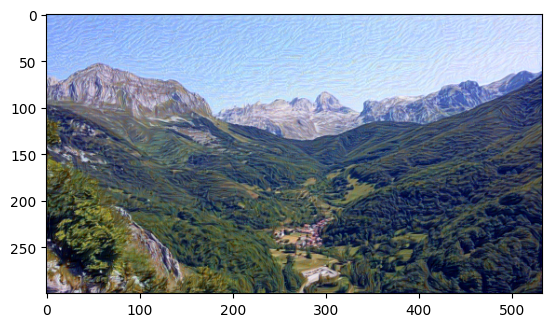

Iteración 400, Pérdida total: 913.998291015625


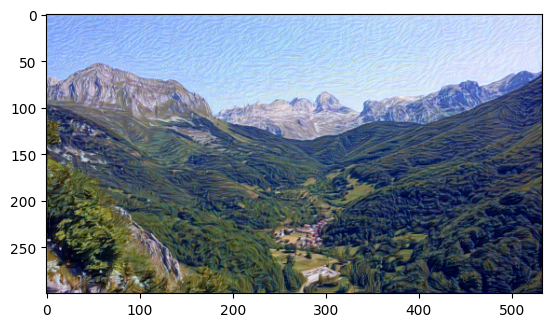

Iteración 500, Pérdida total: 786.9365234375


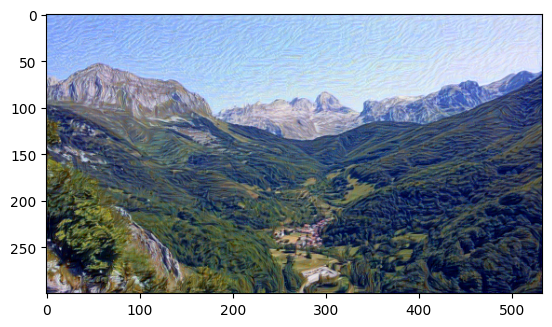

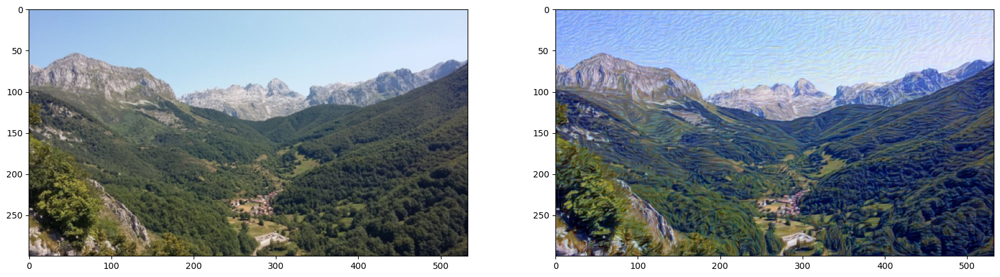

Ejecutando con learning_rate=0.01


In [ ]:
# Configuración de parámetros
learning_rates = [0.003, 0.01, 0.1]

# Otros parámetros constantes
content_weight = 1e2
style_weight = 1e2
steps = 500 # número de iteraciones
show_every = 100

for learning_rate in learning_rates:
    print(f"Ejecutando con learning_rate={learning_rate}")

    # Extraer características de contenido y estilo de las imágenes originales
    content_features = get_features(content, vgg_features)
    style_features = get_features(style, vgg_features)

    # Calcular la matriz gram de cada capa de estilo
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # Crear una tercera imagen "target" que se va a ir modificando
    target = content.clone().requires_grad_(True).to(device)

    # Definir el optimizador sobre los parámetros de la imagen target
    optimizer = optim.Adam([target], lr=learning_rate)

    for ii in range(1, steps + 1):
        # Extraer las características de la imagen generada
        target_features = get_features(target, vgg_features)

        # Definir la función de pérdida de contenido
        content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2']) ** 2)

        # Definir la función de pérdida de estilo como suma de la pérdida de cada capa
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            # Calcular la "pérdida de estilo" de la capa actual y la ponderar
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
            # Añadirla a la pérdida de estilo
            style_loss += layer_style_loss / (d * h * w)

        # Calcular la pérdida total
        total_loss = content_weight * content_loss + style_weight * style_loss

        # Actualizar la imagen generada mediante el optimizador
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Mostrar las imágenes intermedias y su pérdida
        if ii % show_every == 0:
            print(f"Iteración {ii}, Pérdida total: {total_loss.item()}")
            plt.imshow(im_convert(target))
            plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(im_convert(content))
    ax2.imshow(im_convert(target))
    plt.show()

**Modificando pasos**

In [ ]:
# Configuración de parámetros
steps_list = [500, 1000, 2000]

# Otros parámetros constantes
content_weight = 1e2
style_weight = 1e2
learning_rate = 0.1
show_every = 100

for steps in steps_list:
    print(f"Ejecutando con steps={steps}")

    # Extraer características de contenido y estilo de las imágenes originales
    content_features = get_features(content, vgg_features)
    style_features = get_features(style, vgg_features)

    # Calcular la matriz gram de cada capa de estilo
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # Crear una tercera imagen "target" que se va a ir modificando
    target = content.clone().requires_grad_(True).to(device)

    # Definir el optimizador sobre los parámetros de la imagen target
    optimizer = optim.Adam([target], lr=learning_rate)

    for ii in range(1, steps + 1):
        # Extraer las características de la imagen generada
        target_features = get_features(target, vgg_features)

        # Definir la función de pérdida de contenido
        content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2']) ** 2)

        # Definir la función de pérdida de estilo como suma de la pérdida de cada capa
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            # Calcular la "pérdida de estilo" de la capa actual y la ponderar
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
            # Añadirla a la pérdida de estilo
            style_loss += layer_style_loss / (d * h * w)

        # Calcular la pérdida total
        total_loss = content_weight * content_loss + style_weight * style_loss

        # Actualizar la imagen generada mediante el optimizador
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Mostrar las imágenes intermedias y su pérdida
        if ii % show_every == 0:
            print(f"Iteración {ii}, Pérdida total: {total_loss.item()}")
            plt.imshow(im_convert(target))
            plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(im_convert(content))
    ax2.imshow(im_convert(target))
    plt.show()

# Preguntas
### **1 - ¿Cuántas capas lineales contiene el clasificador de VGG19?**

El clasificador de VGG19 contiene 3 capas lineales.




### **2 - ¿Cuántas clases distintas puede reconocer VGG19 en su configuración original?**

VGG19 puede reconocer 1000 clases distintas en su configuración original.

### **3 - Indica los identificadores de capas convolucionales a continuación de capas de max pooling**

Identificadores de capas convolucionales a continuación de capas de max pooling:

Conv2d (5)
Conv2d (10)
Conv2d (19)
Conv2d (28)

### **4 - ¿Qué influencia tienen los cambios solicitados (content_weight, style_weight, learning rate, steps) en las imágenes intermedias y en la imagen resultante?**

**Content_weight y Style_weight:**

**(1 y 1e6):** El estilo domina en la imagen resultante. Las características del contenido se ven menos afectadas.

**(1e2 y 1e2):** Hay un equilibrio entre el contenido y el estilo. Ambos se representan de manera balanceada en la imagen resultante.

**(1e2 y 1e-2):** El contenido domina en la imagen resultante. Las características del estilo se ven menos.

**Learning rate (tasa de aprendizaje):**

**0.003:** La convergencia es más lenta y los cambios en las imágenes intermedias son más suaves y graduales.

**0.01:** La convergencia es moderada y los cambios en las imágenes intermedias son balanceados.

**0.1:** La convergencia es rápida, pero puede causar inestabilidad en la optimización, lo que resulta en cambios bruscos en las imágenes intermedias.

**Steps (etapas de entrenamiento):**

**500:** La imagen resultante es menos refinada y los detalles del estilo y contenido son menos pronunciados.

**1000:** La imagen resultante es más detallada y refinada.

**2000:** La imagen resultante es muy detallada, pero el tiempo de computación es mayor y existe el riesgo de sobreajuste.